In [20]:
!nvidia-smi

Wed Sep  3 14:26:08 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8             10W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("ROBOFLOW_API_KEY")


In [25]:
import os
HOME = os.getcwd()
print(HOME)

/kaggle/working


In [21]:
%pip install "ultralytics<=8.3.40" supervision roboflow
# prevent ultralytics from tracking your activity
!yolo settings sync=False
import ultralytics
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.6/8062.4 GB disk)


In [27]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from roboflow import Roboflow
from kaggle_secrets import UserSecretsClient

user_secrets = UserSecretsClient()

ROBOFLOW_API_KEY = user_secrets.get_secret("ROBOFLOW_API_KEY")
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

workspace = rf.workspace("polytech-hmvbr")
project = rf.workspace("polytech-hmvbr").project("book-spine-detection-2cci9-0u1sz")
version = project.version(5)
dataset = version.download("yolov8-obb")

/kaggle/working/datasets
loading Roboflow workspace...
loading Roboflow workspace...
loading Roboflow project...


RuntimeError: Version number 5 is not found.

In [26]:
import yaml

with open(f'{dataset.location}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['path'] = dataset.location

with open(f'{dataset.location}/data.yaml', 'w') as file:
    yaml.dump(data, file, sort_keys=False)

NameError: name 'dataset' is not defined

In [8]:
%cd {HOME}
%pip install -U ray==2.9.0

from ultralytics import YOLO

# Load a pretrained YOLO11n model
model = YOLO("yolo11n-obb.pt")

# Train the model on the COCO8 dataset for 100 epochs
train_results = model.train(
    data=f"{dataset.location}/data.yaml",  # Path to dataset configuration file
    epochs=100,  # Number of training epochs
    imgsz=640,  # Image size for training
    device=1,  # Device to run on (e.g., 'cpu', 0, [0,1,2,3])
)

/kaggle/working
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 MB 26.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: ray
    Found existing installation: ray 2.47.1
    Uninstalling ray-2.47.1:
      Successfully uninstalled ray-2.47.1
Note: you may need to restart the kernel to use updated packages.


100%|██████████| 5.53M/5.53M [00:00<00:00, 74.5MB/s]


New https://pypi.org/project/ultralytics/8.3.192 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: task=obb, mode=train, model=yolo11n-obb.pt, data=/kaggle/working/datasets/book-spine-detection-5/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=1, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed

100%|██████████| 755k/755k [00:00<00:00, 17.4MB/s]
E0000 00:00:1756893901.816636      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756893901.929348      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 72.5MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/book-spine-detection-5/train/labels... 8151 images, 0 backgrounds, 86 corrupt: 100%|██████████| 8151/8151 [00:09<00:00, 904.57it/s] 

train: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/train/images/0_004_jpg.rf.05cbd26d9ea6ee0d553a55d58b695c26.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0105]
train: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/train/images/0_004_jpg.rf.17f70ff2841e1b5aec9fef80085e0f26.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0576      1.0838]
train: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/train/images/0_004_jpg.rf.7ba6398ed4026da718f7cc62e6c7a8db.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0161      1.0057]
train: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/train/images/0_061_jpg.rf.33923a02f0bd94f201e8e75ed979f525.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0074      1.0051]
train: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/train/images/0_061_jpg.rf.

train: New cache created: /kaggle/working/datasets/book-spine-detection-5/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /kaggle/working/datasets/book-spine-detection-5/valid/labels... 782 images, 0 backgrounds, 20 corrupt: 100%|██████████| 782/782 [00:01<00:00, 707.11it/s]

val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/0_077_jpg.rf.4e0ecb9453e4d4708854ea8aeaf4e1c0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0043       1.002]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/5_086_jpg.rf.f7abf06fad18f352bdc0820ec216bcd7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.018]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/8_019_jpg.rf.324f468baccf61ab02e8c2f6f1e2737a.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0255]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/8_026_jpg.rf.2a2ee544181a140a11ed724f7962fb5d.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0569]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/8_026_jpg.rf.8e8bed45f5f64d6f94b28c6c410ca2cc.j

val: New cache created: /kaggle/working/datasets/book-spine-detection-5/valid/labels.cache
Plotting labels to runs/obb/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/obb/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.69G      2.102      1.504      2.646         22        640: 100%|██████████| 505/505 [01:52<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:10<00:00,  4.61it/s]

                   all        762      13046      0.827      0.805      0.862      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      3.38G      1.638      1.042      2.223         69        640: 100%|██████████| 505/505 [01:43<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.18it/s]


                   all        762      13046      0.809      0.842       0.88      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       3.4G      1.616     0.9981      2.067         44        640: 100%|██████████| 505/505 [01:41<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.20it/s]


                   all        762      13046      0.817      0.854      0.872      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      3.38G      1.576     0.9822      1.986         25        640: 100%|██████████| 505/505 [01:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.23it/s]


                   all        762      13046      0.864      0.859      0.902      0.515

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.27G      1.516     0.9467      1.918         19        640: 100%|██████████| 505/505 [01:41<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.37it/s]

                   all        762      13046      0.885      0.889      0.932      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      3.63G      1.462     0.9091      1.865         22        640: 100%|██████████| 505/505 [01:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.27it/s]

                   all        762      13046      0.875        0.9      0.928      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      3.89G      1.422     0.8831      1.827         16        640: 100%|██████████| 505/505 [01:39<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.70it/s]

                   all        762      13046      0.881      0.863      0.922      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      3.51G       1.39     0.8612      1.793         18        640: 100%|██████████| 505/505 [01:40<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.46it/s]

                   all        762      13046      0.872        0.9      0.925      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.75G      1.373     0.8529      1.775         61        640: 100%|██████████| 505/505 [01:41<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.74it/s]

                   all        762      13046      0.918      0.915      0.957      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.03G      1.361     0.8423      1.753         55        640: 100%|██████████| 505/505 [01:40<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.59it/s]

                   all        762      13046      0.892      0.918       0.94      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100       4.2G      1.335     0.8276      1.741         26        640: 100%|██████████| 505/505 [01:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.68it/s]

                   all        762      13046      0.918      0.916       0.96      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.11G       1.32     0.8117      1.729         30        640: 100%|██████████| 505/505 [01:39<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.69it/s]

                   all        762      13046      0.927      0.926      0.963      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.56G      1.305     0.8064       1.71         21        640: 100%|██████████| 505/505 [01:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.79it/s]

                   all        762      13046      0.925      0.923      0.962      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.52G      1.302      0.801      1.712         21        640: 100%|██████████| 505/505 [01:40<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.70it/s]

                   all        762      13046      0.921      0.927      0.966      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      3.36G      1.288     0.7922      1.691         29        640: 100%|██████████| 505/505 [01:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.84it/s]

                   all        762      13046      0.913      0.917      0.953      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      3.35G      1.272     0.7792      1.673         22        640: 100%|██████████| 505/505 [01:40<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.76it/s]

                   all        762      13046      0.919      0.927      0.961      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      3.94G      1.266     0.7824      1.675         35        640: 100%|██████████| 505/505 [01:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.72it/s]

                   all        762      13046      0.911      0.927      0.957      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      3.81G      1.254     0.7714      1.677         27        640: 100%|██████████| 505/505 [01:39<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.82it/s]

                   all        762      13046      0.919      0.932      0.964      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      3.31G      1.247     0.7669      1.665         15        640: 100%|██████████| 505/505 [01:39<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.75it/s]

                   all        762      13046      0.922      0.928      0.957       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       3.2G      1.238      0.759      1.666         27        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.71it/s]

                   all        762      13046      0.925      0.931      0.968      0.723



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.02G      1.235     0.7529      1.658         66        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.92it/s]

                   all        762      13046      0.922      0.937      0.967       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.67G      1.225     0.7509      1.646         62        640: 100%|██████████| 505/505 [01:40<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.86it/s]

                   all        762      13046      0.924      0.939      0.964      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      3.87G      1.211      0.743      1.647         24        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.68it/s]

                   all        762      13046       0.92      0.939      0.962      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      3.74G      1.208     0.7418      1.644         50        640: 100%|██████████| 505/505 [01:38<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.01it/s]

                   all        762      13046      0.936      0.941      0.971      0.742



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.92G      1.204     0.7414       1.63          8        640: 100%|██████████| 505/505 [01:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.85it/s]

                   all        762      13046      0.931      0.936      0.969      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.33G      1.197     0.7334      1.628         47        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.70it/s]

                   all        762      13046      0.932      0.941      0.969      0.743



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      3.48G      1.187     0.7276       1.63         44        640: 100%|██████████| 505/505 [01:38<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.99it/s]

                   all        762      13046      0.934       0.94      0.971      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.72G      1.185     0.7236      1.626         38        640: 100%|██████████| 505/505 [01:39<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.87it/s]

                   all        762      13046      0.933      0.945       0.97      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      3.05G       1.17     0.7196      1.622         55        640: 100%|██████████| 505/505 [01:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.96it/s]

                   all        762      13046      0.922       0.94      0.965      0.745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      3.68G      1.166     0.7167      1.623         26        640: 100%|██████████| 505/505 [01:39<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.78it/s]

                   all        762      13046      0.922      0.946      0.964      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.85G      1.163     0.7118      1.615         42        640: 100%|██████████| 505/505 [01:39<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.95it/s]

                   all        762      13046      0.932      0.939      0.971      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      3.53G      1.163     0.7125      1.621          5        640: 100%|██████████| 505/505 [01:39<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.86it/s]

                   all        762      13046       0.93      0.949      0.972      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.87G      1.147     0.7046      1.606         26        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.89it/s]

                   all        762      13046      0.934      0.949      0.974      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      3.51G      1.138     0.7034      1.608         38        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.87it/s]

                   all        762      13046      0.941       0.95      0.974      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      3.21G      1.141      0.696      1.612         49        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.87it/s]

                   all        762      13046      0.942      0.948      0.976      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.27G      1.133     0.6948      1.605         39        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.86it/s]

                   all        762      13046      0.937      0.948      0.975      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       3.9G      1.128     0.6937      1.612         37        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.93it/s]

                   all        762      13046       0.94      0.948      0.975      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       3.2G      1.119     0.6888      1.588         29        640: 100%|██████████| 505/505 [01:38<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.95it/s]

                   all        762      13046      0.938      0.947      0.975      0.771



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      3.48G      1.111     0.6854      1.591         23        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.01it/s]

                   all        762      13046      0.942      0.943      0.975      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.05G      1.118     0.6834      1.594         15        640: 100%|██████████| 505/505 [01:39<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.74it/s]

                   all        762      13046       0.94      0.949      0.975      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      3.45G      1.104     0.6762      1.594         36        640: 100%|██████████| 505/505 [01:39<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.94it/s]

                   all        762      13046      0.941       0.95      0.977       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.38G      1.103     0.6784      1.598         19        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.92it/s]

                   all        762      13046      0.934      0.954      0.973      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      4.06G      1.093      0.676      1.585         27        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.65it/s]

                   all        762      13046      0.942      0.954      0.975      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      3.45G      1.088     0.6726      1.586         33        640: 100%|██████████| 505/505 [01:49<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.79it/s]

                   all        762      13046      0.943      0.949      0.977      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       3.2G      1.085     0.6708      1.586         14        640: 100%|██████████| 505/505 [01:56<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.05it/s]

                   all        762      13046      0.942      0.947      0.976      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      3.67G      1.079     0.6622      1.581         45        640: 100%|██████████| 505/505 [01:57<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.06it/s]

                   all        762      13046      0.941      0.951      0.977      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      3.87G      1.076     0.6608      1.575         28        640: 100%|██████████| 505/505 [01:57<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.10it/s]

                   all        762      13046      0.941      0.953      0.978      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      3.19G      1.073     0.6593      1.579         54        640: 100%|██████████| 505/505 [01:56<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.09it/s]

                   all        762      13046      0.941       0.95      0.977      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      3.58G      1.066     0.6583      1.584         34        640: 100%|██████████| 505/505 [01:56<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.24it/s]

                   all        762      13046       0.94      0.949      0.977      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.19G      1.067     0.6579      1.584         31        640: 100%|██████████| 505/505 [01:51<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.49it/s]

                   all        762      13046      0.945       0.95      0.979       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.82G      1.056     0.6539      1.583         31        640: 100%|██████████| 505/505 [01:49<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.50it/s]

                   all        762      13046      0.946      0.954      0.979      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.52G      1.053     0.6514      1.576         40        640: 100%|██████████| 505/505 [01:43<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.85it/s]

                   all        762      13046      0.945      0.953      0.979       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      3.46G      1.048     0.6489      1.568         28        640: 100%|██████████| 505/505 [01:42<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.40it/s]

                   all        762      13046      0.944      0.954       0.98       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.71G       1.04      0.645      1.567         49        640: 100%|██████████| 505/505 [01:47<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.39it/s]

                   all        762      13046       0.95      0.951       0.98       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      3.84G       1.04     0.6446      1.571         18        640: 100%|██████████| 505/505 [01:46<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.84it/s]

                   all        762      13046      0.946      0.953      0.977      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.09G      1.033     0.6427      1.567         20        640: 100%|██████████| 505/505 [01:41<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.71it/s]

                   all        762      13046      0.945      0.953      0.977      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      3.62G      1.029     0.6394      1.562         47        640: 100%|██████████| 505/505 [01:40<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.79it/s]

                   all        762      13046      0.945      0.954      0.978      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      3.57G      1.028     0.6363      1.565         52        640: 100%|██████████| 505/505 [01:42<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.77it/s]

                   all        762      13046      0.946      0.955      0.979      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.88G      1.016     0.6342       1.56         50        640: 100%|██████████| 505/505 [01:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.79it/s]

                   all        762      13046      0.942      0.955      0.978      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      3.84G      1.013     0.6314      1.558         18        640: 100%|██████████| 505/505 [01:47<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.11it/s]

                   all        762      13046      0.947      0.956      0.979      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      3.57G      1.003      0.627      1.554         31        640: 100%|██████████| 505/505 [01:52<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.40it/s]

                   all        762      13046      0.948      0.956      0.981      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      3.74G      1.006      0.629      1.559         28        640: 100%|██████████| 505/505 [01:52<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.00it/s]

                   all        762      13046      0.946      0.957       0.98      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.94G     0.9962     0.6237      1.551          4        640: 100%|██████████| 505/505 [01:53<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.24it/s]

                   all        762      13046      0.948      0.954       0.98        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      3.52G      1.001      0.627      1.556         49        640: 100%|██████████| 505/505 [01:52<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.13it/s]

                   all        762      13046      0.949      0.955       0.98      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      3.29G     0.9947     0.6225       1.55         56        640: 100%|██████████| 505/505 [01:48<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.21it/s]

                   all        762      13046       0.95      0.955      0.982      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.13G     0.9891     0.6212      1.558         42        640: 100%|██████████| 505/505 [01:52<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.06it/s]

                   all        762      13046      0.949      0.955      0.981      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      3.62G     0.9855     0.6179      1.553         60        640: 100%|██████████| 505/505 [01:53<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.23it/s]

                   all        762      13046      0.953      0.954      0.982      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.58G     0.9814     0.6152      1.551         18        640: 100%|██████████| 505/505 [01:52<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.33it/s]

                   all        762      13046      0.952      0.956      0.983      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       3.2G     0.9784     0.6175       1.55          7        640: 100%|██████████| 505/505 [01:51<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.55it/s]

                   all        762      13046      0.948      0.958      0.982      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       4.2G     0.9737     0.6136      1.549         10        640: 100%|██████████| 505/505 [01:52<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.48it/s]

                   all        762      13046      0.949      0.958      0.983      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      3.84G     0.9692     0.6094      1.548         57        640: 100%|██████████| 505/505 [01:50<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.08it/s]

                   all        762      13046      0.947      0.959      0.983      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      3.54G      0.963     0.6053      1.542         58        640: 100%|██████████| 505/505 [01:52<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:08<00:00,  5.97it/s]

                   all        762      13046      0.946       0.96      0.982      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       3.5G      0.964     0.6066      1.549         10        640: 100%|██████████| 505/505 [01:53<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.17it/s]

                   all        762      13046      0.951      0.957      0.982      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      3.51G     0.9557     0.6025      1.545         14        640: 100%|██████████| 505/505 [01:48<00:00,  4.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.03it/s]

                   all        762      13046       0.95      0.958      0.982      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.31G     0.9499     0.5998      1.536         26        640: 100%|██████████| 505/505 [01:51<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.81it/s]

                   all        762      13046      0.951      0.957      0.982      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      3.71G      0.952     0.6016      1.531         19        640: 100%|██████████| 505/505 [01:39<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.77it/s]

                   all        762      13046       0.95       0.96      0.983       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.18G     0.9461     0.5977      1.538         28        640: 100%|██████████| 505/505 [01:40<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.85it/s]

                   all        762      13046      0.951      0.957      0.982      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      3.23G     0.9425     0.5952      1.535         68        640: 100%|██████████| 505/505 [01:38<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.93it/s]

                   all        762      13046      0.956      0.953      0.983      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      3.62G     0.9366     0.5928      1.535         30        640: 100%|██████████| 505/505 [01:37<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.06it/s]

                   all        762      13046      0.956      0.957      0.984      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       3.6G     0.9301     0.5912      1.529          9        640: 100%|██████████| 505/505 [01:38<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.98it/s]

                   all        762      13046      0.955      0.956      0.983      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      3.86G     0.9287     0.5881      1.524         25        640: 100%|██████████| 505/505 [01:39<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.04it/s]

                   all        762      13046      0.954      0.957      0.983      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      3.73G      0.923     0.5857      1.525         43        640: 100%|██████████| 505/505 [01:38<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.96it/s]

                   all        762      13046      0.958      0.957      0.984      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      3.93G     0.9232     0.5855      1.528         15        640: 100%|██████████| 505/505 [01:38<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.97it/s]

                   all        762      13046      0.955      0.957      0.983      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      3.32G     0.9189      0.582      1.529         58        640: 100%|██████████| 505/505 [01:42<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.39it/s]

                   all        762      13046      0.953       0.96      0.984      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.28G     0.9187      0.582      1.526         14        640: 100%|██████████| 505/505 [01:52<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.01it/s]

                   all        762      13046      0.955      0.958      0.983      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      3.53G     0.9125      0.581      1.523          4        640: 100%|██████████| 505/505 [01:52<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.32it/s]

                   all        762      13046      0.956      0.959      0.984      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      3.75G     0.9103     0.5769      1.523         36        640: 100%|██████████| 505/505 [01:50<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.49it/s]

                   all        762      13046      0.953       0.96      0.983      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      3.75G     0.9053     0.5755      1.515         49        640: 100%|██████████| 505/505 [01:47<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.45it/s]

                   all        762      13046      0.954      0.959      0.983      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.02G     0.8997     0.5713      1.522         24        640: 100%|██████████| 505/505 [01:42<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.92it/s]

                   all        762      13046      0.954      0.959      0.983      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      3.74G     0.8972     0.5715      1.515         13        640: 100%|██████████| 505/505 [01:38<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.40it/s]

                   all        762      13046      0.955      0.959      0.983      0.817


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      3.16G     0.9079     0.5714      1.477         23        640: 100%|██████████| 505/505 [01:34<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.69it/s]

                   all        762      13046      0.958      0.956      0.983      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      3.12G      0.889     0.5586      1.466          3        640: 100%|██████████| 505/505 [01:30<00:00,  5.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.81it/s]

                   all        762      13046      0.958      0.958      0.984      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.93G     0.8819     0.5532       1.47         27        640: 100%|██████████| 505/505 [01:29<00:00,  5.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.00it/s]

                   all        762      13046       0.96      0.958      0.984      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      3.14G     0.8748     0.5477      1.467         19        640: 100%|██████████| 505/505 [01:29<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.99it/s]

                   all        762      13046       0.96       0.96      0.984       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.89G     0.8695     0.5466      1.465         16        640: 100%|██████████| 505/505 [01:29<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.06it/s]

                   all        762      13046       0.96      0.961      0.984      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      3.15G     0.8672     0.5443       1.46         20        640: 100%|██████████| 505/505 [01:29<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.90it/s]

                   all        762      13046       0.96      0.961      0.984      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.86G     0.8637     0.5406      1.467         16        640: 100%|██████████| 505/505 [01:29<00:00,  5.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.94it/s]

                   all        762      13046       0.96      0.961      0.984      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.82G     0.8547     0.5384      1.458          3        640: 100%|██████████| 505/505 [01:29<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.05it/s]

                   all        762      13046       0.96      0.961      0.985      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       2.9G     0.8504      0.533       1.46         14        640: 100%|██████████| 505/505 [01:29<00:00,  5.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.98it/s]

                   all        762      13046      0.961      0.961      0.984      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.74G     0.8446     0.5316      1.462          9        640: 100%|██████████| 505/505 [01:29<00:00,  5.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  6.99it/s]

                   all        762      13046       0.96      0.961      0.984      0.824



100 epochs completed in 3.082 hours.
Optimizer stripped from runs/obb/train/weights/last.pt, 5.8MB
Optimizer stripped from runs/obb/train/weights/best.pt, 5.8MB

Validating runs/obb/train/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:1 (Tesla T4, 15095MiB)
YOLO11n-obb summary (fused): 257 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:15<00:00,  3.05it/s]


                   all        762      13046      0.961      0.961      0.984      0.824


invalid value encountered in less
invalid value encountered in less


Speed: 0.3ms preprocess, 2.9ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/obb/train


In [11]:
!ls {HOME}/runs/obb/train

args.yaml					  train_batch1.jpg
confusion_matrix_normalized.png			  train_batch2.jpg
confusion_matrix.png				  train_batch45450.jpg
events.out.tfevents.1756893918.27ec02e59e7f.36.0  train_batch45451.jpg
F1_curve.png					  train_batch45452.jpg
labels_correlogram.jpg				  val_batch0_labels.jpg
labels.jpg					  val_batch0_pred.jpg
P_curve.png					  val_batch1_labels.jpg
PR_curve.png					  val_batch1_pred.jpg
R_curve.png					  val_batch2_labels.jpg
results.csv					  val_batch2_pred.jpg
results.png					  weights
train_batch0.jpg


In [24]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/obb/train/confusion_matrix.png', width=640)

NameError: name 'HOME' is not defined

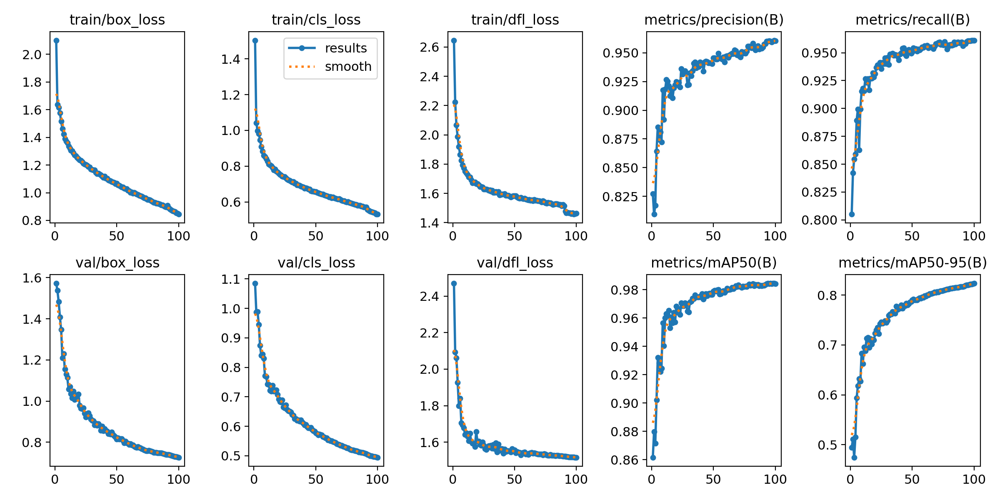

In [15]:
IPyImage(filename=f'{HOME}/runs/obb/train/results.png', width=640)

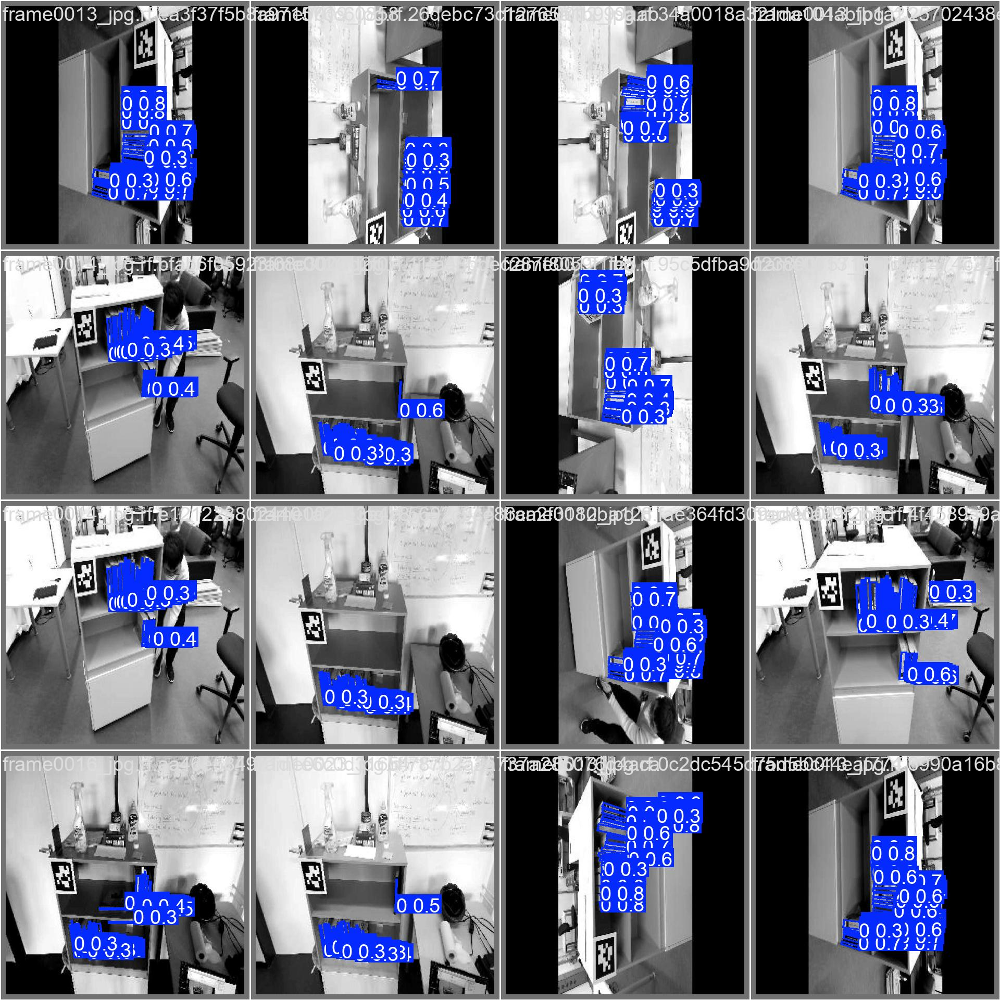

In [17]:
IPyImage(filename=f'{HOME}/runs/obb/train/val_batch0_pred.jpg', width=600)

In [18]:
!yolo task=obb mode=val model={HOME}/runs/obb/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-obb summary (fused): 257 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs
val: Scanning /kaggle/working/datasets/book-spine-detection-5/valid/labels.cache
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/0_077_jpg.rf.4e0ecb9453e4d4708854ea8aeaf4e1c0.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0043       1.002]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/5_086_jpg.rf.f7abf06fad18f352bdc0820ec216bcd7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [      1.018]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/8_019_jpg.rf.324f468baccf61ab02e8c2f6f1e2737a.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0255]
val: WARNING ⚠️ /kaggle/working/datasets/book-spine-detection-5/valid/images/8_026_jpg.rf.

In [20]:
!yolo task=obb mode=predict model={HOME}/runs/obb/train/weights/best.pt conf=0.5 source={dataset.location}/test/images save=True

Ultralytics 8.3.40 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-obb summary (fused): 257 layers, 2,653,918 parameters, 0 gradients, 6.6 GFLOPs

image 1/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_043_jpg.rf.f10e801bdcaf4615cd12ee88a4f189f9.jpg: 640x640 9.1ms
image 2/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_047_jpg.rf.2bd886941bff3cdd56fee000b4519e8d.jpg: 640x640 9.4ms
image 3/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_047_jpg.rf.7057b90ec9a21e3bac2635b77d8d3a2f.jpg: 640x640 9.6ms
image 4/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_052_jpg.rf.f84aa1f67eed30e86ed6b6c010067dea.jpg: 640x640 9.1ms
image 5/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_058_jpg.rf.4a501928fed46de4565d58b90b4dd4a5.jpg: 640x640 8.6ms
image 6/380 /kaggle/working/datasets/book-spine-detection-5/test/images/0_059_jpg.rf.4c0ca7751c3e80a770a18058c2da159c.jpg: 640x640 8.5ms
image 7/

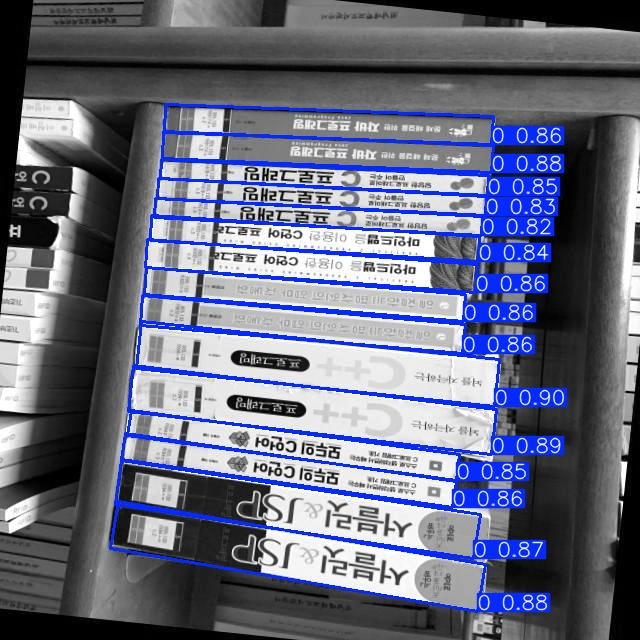

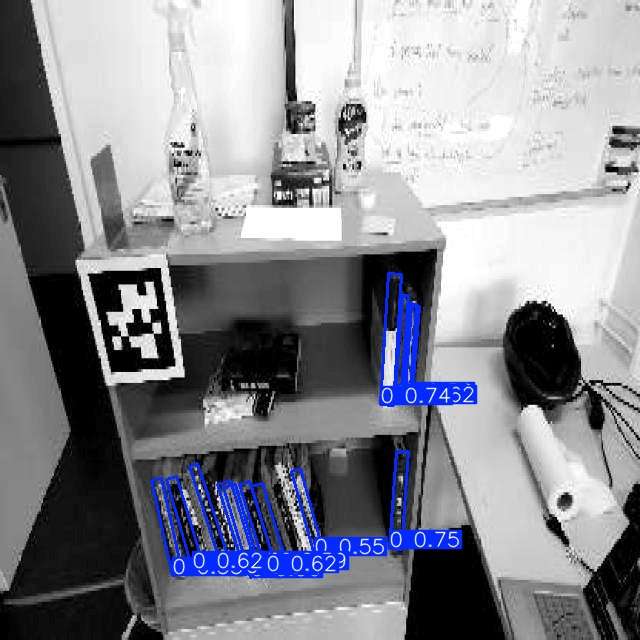

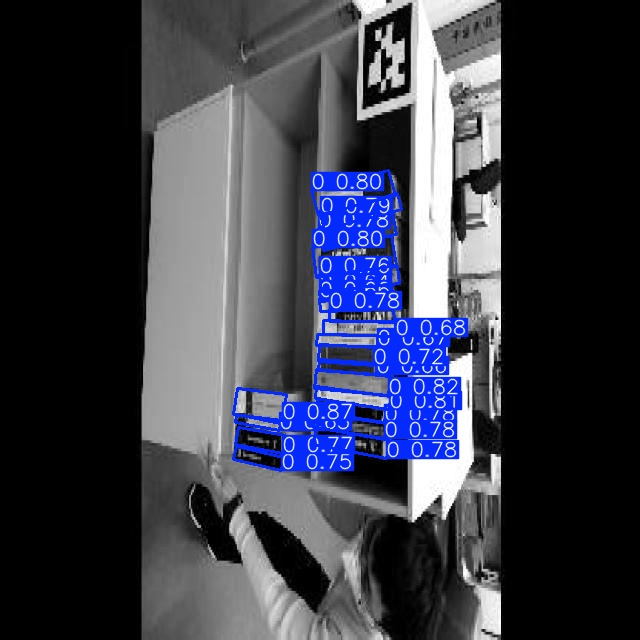

In [21]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob(f'{HOME}/runs/obb/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [22]:
!pip install inference

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.7/105.7 kB 5.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 6.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 34.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.1/190.1 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.9/75.9 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 58.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 243.4/243.4 kB 15.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.0/64.0 kB 3.9 M

In [25]:
project.version(dataset.version).deploy(model_type="yolov8-obb", model_path=f"{HOME}/runs/obb/train/")

Dependency ultralytics==8.0.196 is required but found version=8.3.40, to fix: `pip install ultralytics==8.0.196`


Would you like to continue with the wrong version of ultralytics? y/n:  y


An error occured when getting the model upload URL: This version already has a trained model. Please generate and train a new version in order to upload model to Roboflow.



image 1/1 /kaggle/input/img-test/IMG_4139.JPG: 480x640 54.9ms
Speed: 3.2ms preprocess, 54.9ms inference, 3.4ms postprocess per image at shape (1, 3, 480, 640)


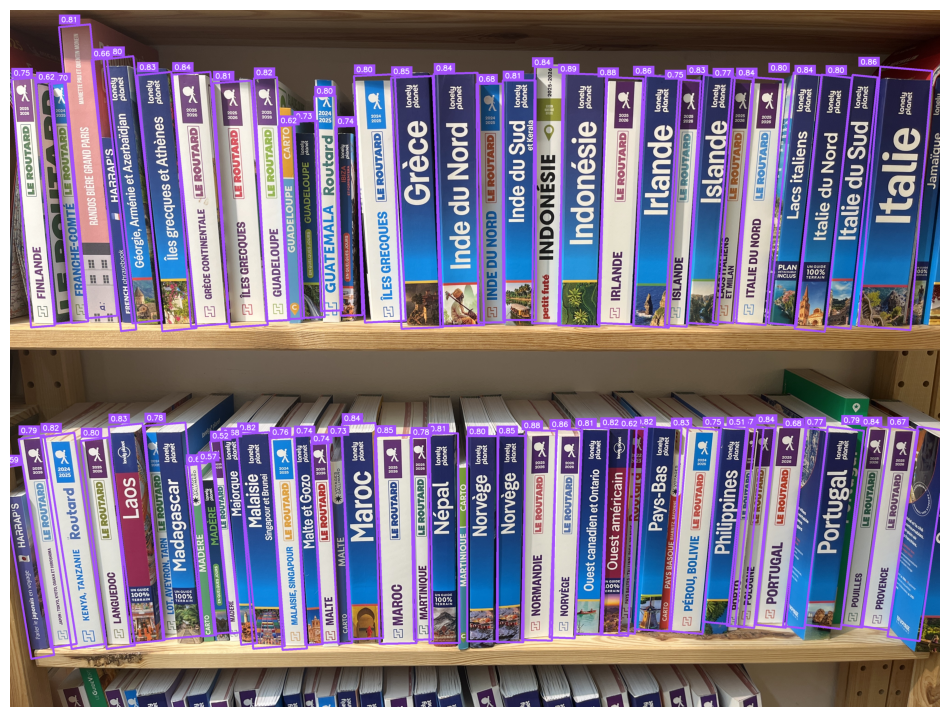

Il y a environ : 68 detecte !


In [30]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4139.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_3970.jpg: 480x640 10.7ms
Speed: 3.0ms preprocess, 10.7ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


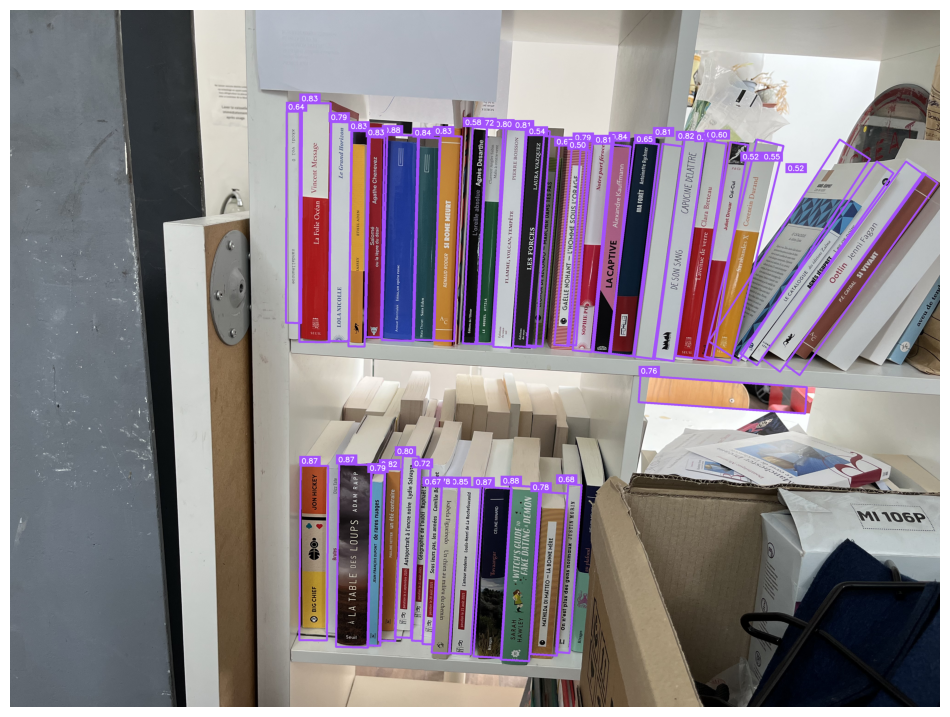

Il y a environ : 41 detecte !


In [32]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_3970.jpg"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4029.JPG: 640x480 54.3ms
Speed: 3.0ms preprocess, 54.3ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


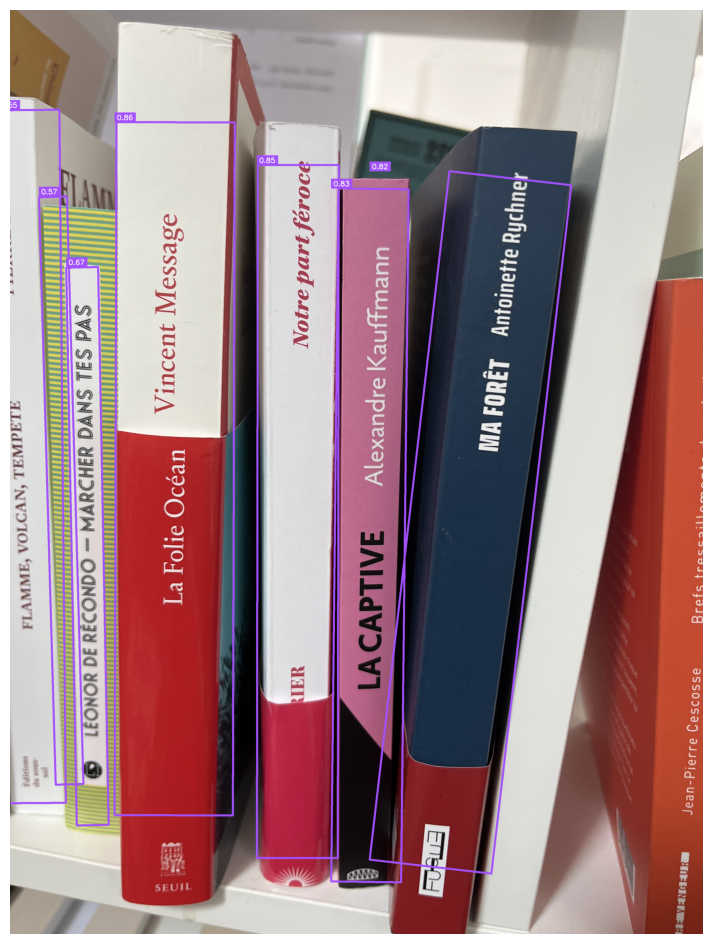

Il y a environ : 7 detecte !


In [33]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4029.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4029.JPG: 640x480 11.0ms
Speed: 3.1ms preprocess, 11.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


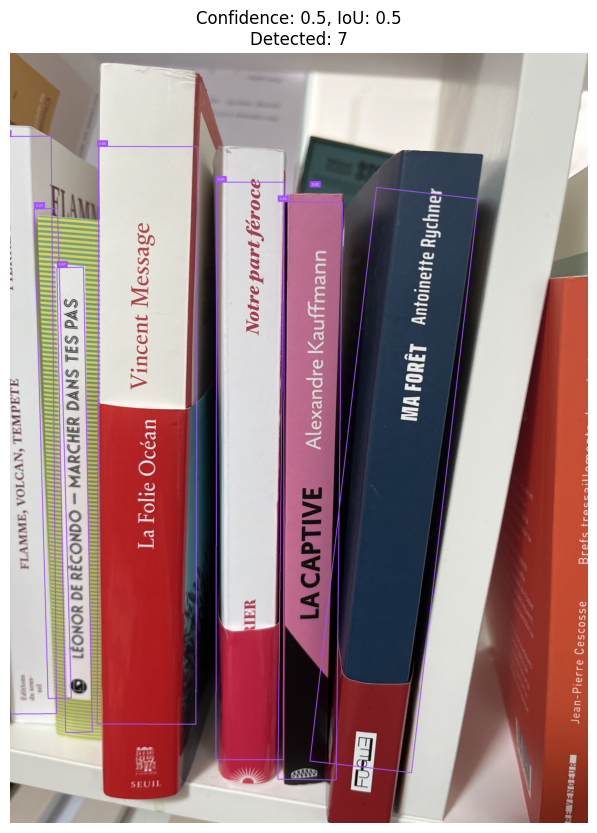

Il y a environ : 7 detecte !


In [46]:
from ultralytics import YOLO
import supervision as sv
import cv2
import matplotlib.pyplot as plt

# --- Charger le modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Définir le chemin de l'image test ---
file_name = "/kaggle/input/img-test/IMG_4029.JPG" # 🔹 mets ton chemin d'image ici
image = cv2.imread(file_name)

# --- Définir les seuils de confiance et d'IoU ---
conf_thresh = 0.50
iou_thresh = 0.50

# --- Faire la prédiction avec les seuils spécifiés ---
results = model(file_name, conf=conf_thresh, iou=iou_thresh)

# --- Convertir les résultats en détections supervision ---
# Supervision applique automatiquement la NMS avec le seuil IoU spécifié lors de cette conversion
detections = sv.Detections.from_ultralytics(results[0])

# --- Créer les annotateurs pour les boîtes orientées et les labels ---
oriented_box_annotator = sv.OrientedBoxAnnotator(thickness=4)
label_annotator = sv.LabelAnnotator(text_thickness=1, text_scale=0.5)

# --- Annoter l’image avec les boîtes détectées ---
annotated_frame = oriented_box_annotator.annotate(
    scene=image.copy(),
    detections=detections,
)

# --- Annoter l'image avec les scores de confiance ---
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Afficher l'image annotée ---
plt.figure(figsize=(12, 10))
plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
plt.title(f'Confidence: {conf_thresh}, IoU: {iou_thresh}\nDetected: {len(detections)}')
plt.axis('off')
plt.show()

# --- Comptage du nombre de boîtes (livres détectés) ---
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4080.JPG: 480x640 10.6ms
Speed: 2.9ms preprocess, 10.6ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


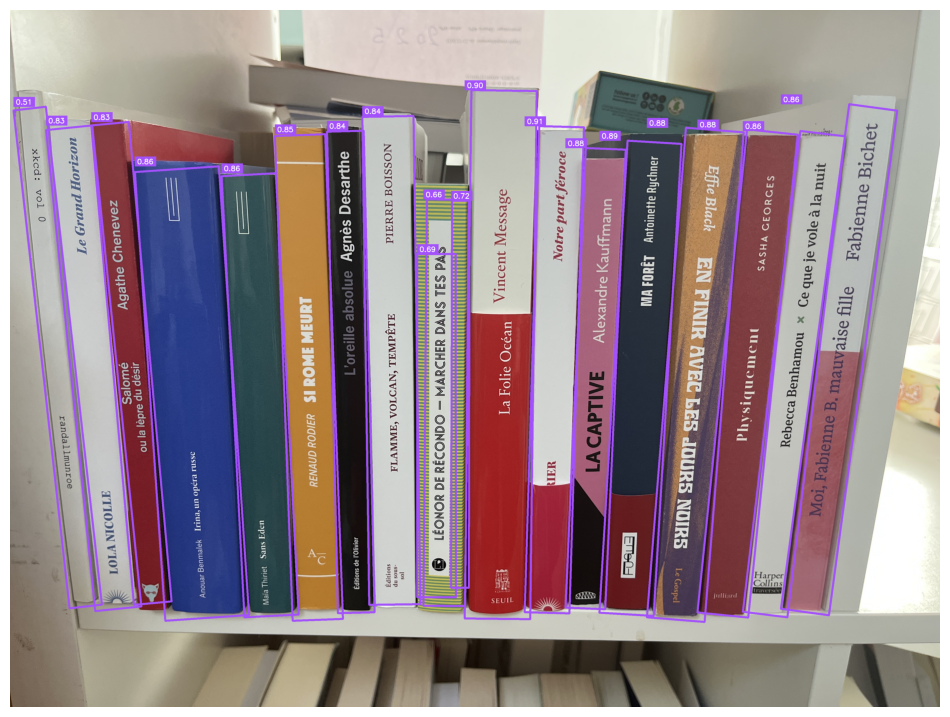

Il y a environ : 19 detecte !


In [35]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4080.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4080.JPG: 480x640 10.8ms
Speed: 3.0ms preprocess, 10.8ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


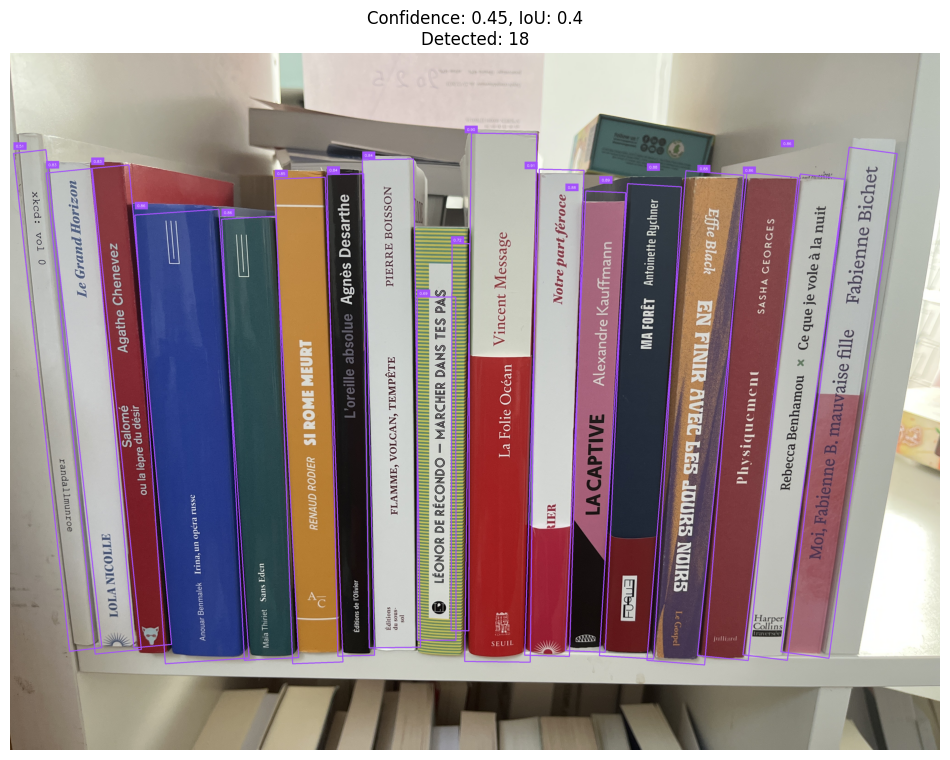

Il y a environ : 18 detecte !


In [53]:
from ultralytics import YOLO
import supervision as sv
import cv2
import matplotlib.pyplot as plt

# --- Charger le modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Définir le chemin de l'image test ---
file_name = "/kaggle/input/img-test/IMG_4080.JPG" # 🔹 mets ton chemin d'image ici
image = cv2.imread(file_name)

# --- Définir les seuils de confiance et d'IoU ---
conf_thresh = 0.45
iou_thresh = 0.40

# --- Faire la prédiction avec les seuils spécifiés ---
results = model(file_name, conf=conf_thresh, iou=iou_thresh)

# --- Convertir les résultats en détections supervision ---
# Supervision applique automatiquement la NMS avec le seuil IoU spécifié lors de cette conversion
detections = sv.Detections.from_ultralytics(results[0])

# --- Créer les annotateurs pour les boîtes orientées et les labels ---
oriented_box_annotator = sv.OrientedBoxAnnotator(thickness=4)
label_annotator = sv.LabelAnnotator(text_thickness=1, text_scale=0.5)

# --- Annoter l’image avec les boîtes détectées ---
annotated_frame = oriented_box_annotator.annotate(
    scene=image.copy(),
    detections=detections,
)

# --- Annoter l'image avec les scores de confiance ---
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Afficher l'image annotée ---
plt.figure(figsize=(12, 10))
plt.imshow(cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB))
plt.title(f'Confidence: {conf_thresh}, IoU: {iou_thresh}\nDetected: {len(detections)}')
plt.axis('off')
plt.show()

# --- Comptage du nombre de boîtes (livres détectés) ---
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4136.JPG: 480x640 11.1ms
Speed: 2.9ms preprocess, 11.1ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


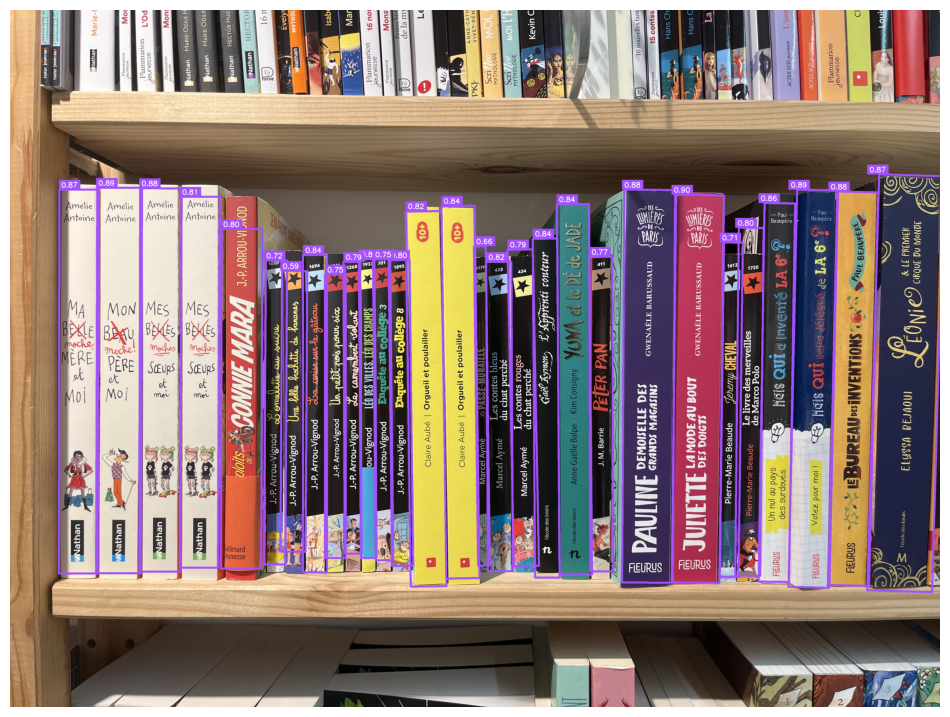

Il y a environ : 29 detecte !


In [36]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4136.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")


image 1/1 /kaggle/input/img-test/IMG_4137.JPG: 480x640 11.5ms
Speed: 3.1ms preprocess, 11.5ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


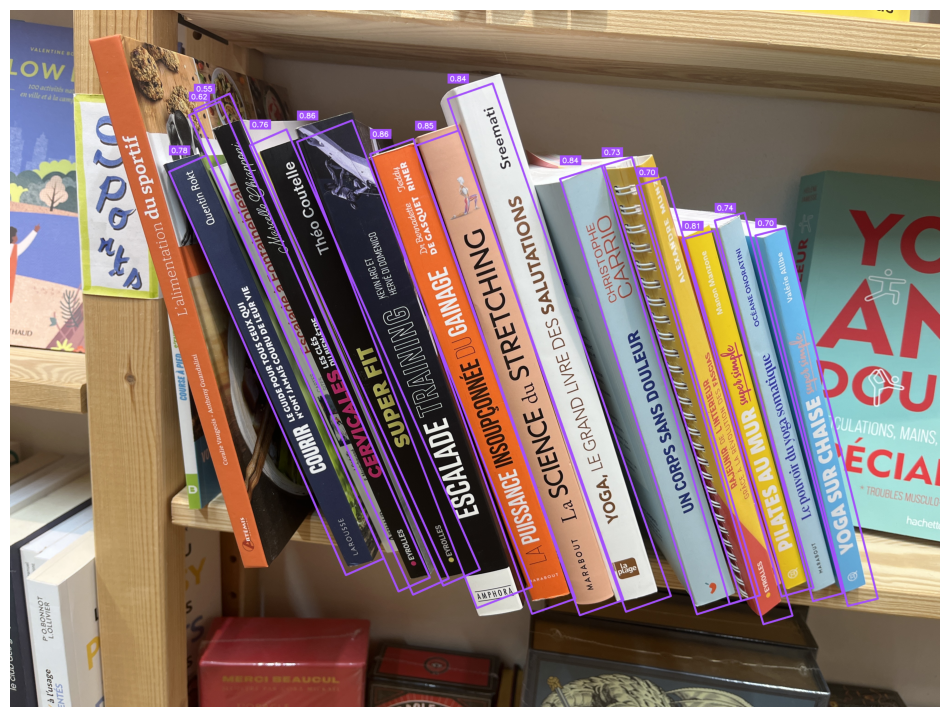

Il y a environ : 14 detecte !


In [37]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4137.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")

In [23]:
from ultralytics import YOLO
import supervision as sv
import cv2

# --- Charger ton modèle entraîné ---
model = YOLO('runs/obb/train/weights/best.pt')

# --- Ici tu choisis toi-même l'image ---
file_name = "/kaggle/input/img-test/IMG_4138.JPG"   # chemin d'image

# --- Faire la prédiction ---
results = model(file_name,conf=0.50)

# --- Convertir les résultats en détections supervision ---
detections = sv.Detections.from_ultralytics(results[0])

# --- Annoter l’image avec les boîtes orientées ---
oriented_box_annotator = sv.OrientedBoxAnnotator(
    thickness=8,    # Epaisseur des boites annotées
)

label_annotator = sv.LabelAnnotator(
    text_thickness=2, # Epaisseur du texte
    text_scale=1 # Taille du texte
)

annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections,
)

annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=[f"{confidence:.2f}" for confidence in detections.confidence] # Afficher le niveau de confiance
)

# --- Affichage ---
sv.plot_image(image=annotated_frame)

# --- Comptage du nombre de boites ( livres détectés )
n_objects = len(detections)
print(f"Il y a environ : {n_objects} detecte !")

FileNotFoundError: [Errno 2] No such file or directory: 'runs/obb/train/weights/best.pt'

In [17]:
import os
os.listdir('/kaggle/input')

['img-test']